<br><br><br><br><br><br>

<center><h2>Predictive Analytics Final Project</h2></center><br><br>

<center><h3>Don Jones</h3></center><br><br>

<center><h3>University of Richmond</h3></center><br><br><br><br><br><br>

<h3>Project Goal: Predict what type of power plant a geographic location might have based on geographic variables.</h3><br><br><br>
<img src='imgs/hex_tile.png'></img><br>



<br><br><br><h2>The Dataset</h2>


I started this project with the intention of synthesizing a bunch of different datasets to predict if a certain type of terrain has an expected energy output. It is fairly common sense that you would place a hydro dam on a river, a photovoltaic farm in a sunny spot, and a wind farm in a place with lots of wind. I wanted to quantify these assumptions. Is there an expected energy output for a given terrain?<br>

I started ambitious. In the spirit of the above assumptions, some of the anticipated datasets involved the amount of sunlight and other atmospheric features. Some of the more interesting features anticipated were distance to bodies of water, such as lakes, rivers, and oceans, and distance to existing infrastructure, such as roads and bridges.<br>

This project evolved as I worked on it. I calculated the feature [distance_to_water_km] and a large amount of the entries were accurate; however, there were too many entries that didn't make sense. With more time, water veracity could have been confirmed and the infrastructure features could have been built.

dataset | selected | validated

1. albedo and sunlight | [x] [x] https://www.ecmwf.int/en/era5-land google-cloud-sdk (not used)
2. precipitation [x] [x] https://www.ncei.noaa.gov/data/global-summary-of-the-day/access/
3. rivers and estuaries [x] [x] cartopy
4. distance from coastline [x] [x] cartopy
7. wind [x] [x] https://www.ncei.noaa.gov/data/global-summary-of-the-day/access/
8. terrain [x] [x] https://www.ncei.noaa.gov/data/global-summary-of-the-day/access/
9. relative humidity [x] [x] https://www.ncei.noaa.gov/data/global-summary-of-the-day/access/
10. power plants [x] [x] https://www.kaggle.com/datasets/jaytilala/global-power-plant

<br><br><br><h2>Feature Discovery Using Unsupervised Learning</h2>

<h2>Introduction</h2>

The potential energy output of a region based on geographic and atmospheric features. Following in the spirit of rural electrification, I wanted to research global patterns of electrification. This project started as a simple regression problem: given some atmospheric features, can the expected energy output of a power plant be predicted. The answer was affirmative.<br>



This project somewhat evolved into discovering patterns of global populations underserved by electrification, much in the spirit of rural electrification. 

In [1]:
import pandas as pd
import numpy as np

import geopandas as gpd

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.lines as mlines
import matplotlib.font_manager as fm

font_path = '/Users/macuser/URCLASS/Analytics/Montserrat/static/Montserrat-Regular.ttf'

fm.fontManager.addfont(font_path)

plt.rcParams['font.family'] = 'sans-serif' 
plt.rcParams['font.sans-serif'] = ['Montserrat']
plt.rcParams['font.size'] = 14.0
plt.rcParams['font.weight'] = 'bold'

from IPython.display import HTML

HTML("""
<style>
/* Targets all output areas */
.jp-OutputArea-output, 
.output_area pre, 
.CodeMirror pre {
    font-family: 'Montserrat', sans-serif !important;
    font-size: 14px !important;
    font-weight: bold !important;
}
</style>
""")

import seaborn as sns

from scipy.stats import binned_statistic_2d

import cartopy.crs as ccrs
import cartopy.feature as cfeature

import os

from collections import OrderedDict

from sklearn.decomposition import PCA

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
import sklearn.metrics as metrics



In [2]:
# =============================================================================
# Code generated by Artificial Intelligence (Google AI)
# Date: 2025-12-10
# Prompt: "Python function to create custom colormap."
# =============================================================================
def create_custom_listed_cmap(cluster_dict):
    """
    Creates a custom, discrete Matplotlib ListedColormap from a dictionary of colors,
    explicitly converting names to RGB values first for consistency.
    """
    color_names_sorted = [item['color'] for key, item in sorted(cluster_dict.items())]
    rgb_colors_sorted = [mcolors.to_rgb(color_name) for color_name in color_names_sorted]
    custom_cmap = mcolors.ListedColormap(rgb_colors_sorted, name='cluster_cmap_5_discrete')
    return custom_cmap

def spatial_merge_left_join(plants_df, atmospheric_df):
    
    gdf_plants = gpd.GeoDataFrame(
        plants_df,
        geometry=gpd.points_from_xy(plants_df.Longitude, plants_df.Latitude),
        crs="EPSG:4326"
    )
    
    gdf_atmospheric = gpd.GeoDataFrame(
        atmospheric_df,
        geometry=gpd.points_from_xy(atmospheric_df.LONGITUDE, atmospheric_df.LATITUDE),
        crs="EPSG:4326"
    )

    LOCAL_CRS = "EPSG:5070" 
    gdf_plants_proj = gdf_plants.to_crs(LOCAL_CRS)
    gdf_atmospheric_proj = gdf_atmospheric.to_crs(LOCAL_CRS)

    power_plants_merged_gdf = gpd.sjoin_nearest(
        gdf_plants_proj, 
        gdf_atmospheric_proj,
        how="left", 
        distance_col="distance_meters"
    )
    
    power_plants_merged_gdf['distance_to_match'] = power_plants_merged_gdf['distance_meters'] / 1000.0

    final_df = pd.DataFrame(power_plants_merged_gdf.drop(columns=['geometry', 'index_right', 'distance_meters']))

    return final_df

def map_match_labels(monthly_pivot, cluster_dict):
    print('\n')
    
    n_clusters = len(cluster_dict)
    
    cluster_col_name = f"CLIMATE ZONE n_clusters={n_clusters}"
    
    df = monthly_pivot.groupby(cluster_col_name).mean()
    
    consistent_labels = [value['name'] for key, value in sorted(cluster_dict.items())]
    
    cmap = create_custom_listed_cmap(cluster_dict)
    
    cmap_colors = cmap.colors 
    
    fig = plt.figure(figsize=(15,2))
    
    _temp = fig.add_subplot(121)
    
    for key, value in cluster_dict.items():
        _temp.plot(df[temp_pivot.columns].loc[key],
                 label=value['name'],
                 color=cmap_colors[key]) 
    
    _temp.set_ylabel("Temperature (°C)")
    
    _temp.set_xticks(_temp.get_xticks()[::2])  
    
    _precip = fig.add_subplot(122)
    
    for key, value in cluster_dict.items():
        _precip.plot(df[precip_pivot.columns].loc[key],
                 label=value['name'],
                 color=cmap_colors[key])
    
    _precip.set_ylabel("Precipitation (mm)")
    
    _precip.set_xticks(_precip.get_xticks()[::2]) 
    
    plt.tight_layout()
    
    plt.show()
    
    print('\n')

    _map = plot_map(f"Climate Zones n_clusters={n_clusters}",
                 monthly_pivot_w_stations['LONGITUDE'],
                 monthly_pivot_w_stations['LATITUDE'],
                 c=monthly_pivot_w_stations[cluster_col_name], # Use the raw cluster IDs (0-4)
                 #labels=consistent_labels, # Use the synchronized list of labels
                 cmap=cmap, 
                 s=10,
                 alpha=0.4)

def plot_map(map_title,
             x,
             y,
             c='blue',
             labels=None,
             cmap=False,
             s=1,
             edgecolor=None,
             linewidths=None,
             alpha=1,
             zorder=1):
    fig = plt.figure(figsize=(12,6))

    _map = fig.add_subplot(1, 1, 1, projection=ccrs.Mercator())

    _map.stock_img()

    _map.add_feature(cfeature.LAND, color='lightgray')

    _map.add_feature(cfeature.OCEAN, color='lightblue')

    _map.add_feature(cfeature.COASTLINE)

    _map.add_feature(cfeature.BORDERS, linestyle=':')

    _map.add_feature(cfeature.LAKES, alpha=0.5, color='lightblue')

    _map.add_feature(cfeature.RIVERS)

    if cmap:
        if edgecolor is not None:
            _map.scatter(x,
                         y,
                         c=c,
                         s=s,
                         cmap=cmap,
                         edgecolor=edgecolor,
                         linewidths=linewidths,
                         alpha=alpha,
                         zorder=zorder,
                         transform=ccrs.PlateCarree())
            
        else:
            _map.scatter(x,
                         y,
                         c=c,
                         s=s,
                         cmap=cmap,
                         alpha=alpha,
                         zorder=zorder,
                         transform=ccrs.PlateCarree())
        
    else:
        _map.scatter(x,
                     y,
                     c=c,
                     s=s,
                     alpha=alpha,
                     zorder=zorder,
                     transform=ccrs.PlateCarree())

    gl = _map.gridlines(draw_labels=True,
                        dms=True,
                        x_inline=False,
                        y_inline=False,
                        color='gray',
                        linestyle='--')

    gl.top_labels = False

    gl.right_labels = False
    
    handles = []

    if labels is not None:
        for i, label in enumerate(labels):
            handle = mlines.Line2D([], [], color=cmap(i), marker='o', linestyle='None',
                              markersize=10, label=label)

            handles.append(handle)

        _map.legend(handles=handles, bbox_to_anchor=(1, 1), loc='upper left')

    _map.set_title(f"{map_title}")

    plt.show()

    return fig

# =============================================================================
# Code generated by Artificial Intelligence (Google AI)
# Date: 2025-12-05
# Prompt: "Python function to convert degrees F to degrees C"
# =============================================================================
def fahrenheit_to_celsius(fahrenheit_temp):
    """
    Converts a temperature from Fahrenheit (°F) to Celsius (°C).
    """
    celsius_temp = (fahrenheit_temp - 32) * 5/9
    return celsius_temp

# =============================================================================
# Code generated by Artificial Intelligence (Google AI)
# Date: 2025-12-05
# Prompt: "Python function to calculate relative humidity from NCEI dataset."
# =============================================================================
def calculate_relative_humidity(x):
    """
    Calculates relative humidity (%) using the Magnus approximation and accounts for pressure.
    
    Args:
        temperature_celsius (float): The current ambient air temperature in Celsius.
        dew_point_celsius (float): The dew point temperature in Celsius.
        station_pressure_hpa (float): The actual pressure at the station level in Hectopascals (hPa) or millibars (mb).
        
    Returns:
        float: The calculated relative humidity as a percentage.
    """
    
    temperature_celsius = x['TEMP_C']
    
    dew_point_celsius = x['DEWP']
    
    station_pressure_hpa = x['STP']
    
    # 1. Calculate Saturation Vapor Pressure (es) at current T (Magnus-Tetens formula)
    # Constants used for water vapor over water
    A = 17.625
    B = 243.04
    es = 6.112 * np.exp((A * temperature_celsius) / (B + temperature_celsius))
    # 2. Calculate Actual Vapor Pressure (e) at Td (e is es at dew point)
    e = 6.112 * np.exp((A * dew_point_celsius) / (B + dew_point_celsius))
    # 3. Apply the Enhancement Factor (f) - This is where pressure comes in
    # This factor corrects for the behavior of moist air at different pressures.
    f = 1 + (1e-6 * station_pressure_hpa * (4.5 + 6e-4 * temperature_celsius**2))
    # 4. Calculate RH
    # RH = (e / (f * es)) * 100
    # For most standard uses, f is very close to 1, and often omitted. 
    # The calculation is robust without it, but more reliable with it.
    
    RH = (e / (f * es)) * 100
    
    # Constrain the result to physical limits
    RH = max(0, min(100, RH))
    return RH

def plot_global_pixelated_heatmaps(population_data,
                                   power_plant_data,
                                   resolution=100,
                                   cmap='flag_r'):
    long_bins = np.linspace(-180, 180, resolution + 1)
    
    lat_bins = np.linspace(-90, 90, resolution + 1)

    fig = plt.figure(figsize=(12, 6))

    plot_dict = {221 : {'dataset' : population_data,
                        'variable' : population_data['population'],
                        'stat' : 'count',
                        'title' : 'Number of Population Entries'},
                 222 : {'dataset' : power_plant_data,
                        'variable' : power_plant_data['Capacity (MW)'],
                        'stat' : 'count',
                        'title' : 'Number of Power Plants'},
                 223 : {'dataset' : population_data,
                        'variable' : population_data['population'],
                        'stat' : 'sum',
                        'title' : 'Total Population'},
                 224 :  {'dataset' : power_plant_data,
                        'variable' : power_plant_data['Capacity (MW)'],
                        'stat' : 'sum',
                        'title' : 'Total Power Plant Capacity (MW)'}
                }

    for key, value in plot_dict.items():
        _subplot = fig.add_subplot(key)

        _subplot.set_title(value['title'])

        subplot_matrix, x_edge, y_edge, binnumber = binned_statistic_2d(
            x=value['dataset']['Longitude'], 
            y=value['dataset']['Latitude'], 
            values=value['variable'], 
            statistic=value['stat'],
            bins=[long_bins, lat_bins]
        )
    
        subplot_pixels = subplot_matrix.T[::-1, :]
    
        sns.heatmap(subplot_pixels,
                    ax=_subplot,
                    cmap=cmap,
                    xticklabels=False,
                     yticklabels=False,
                    cbar=False)

        plot_dict[key]['pixels'] = subplot_pixels
        
    plt.tight_layout()
    
    plt.show()

    return plot_dict

<h3>Step 1: Data Cleaning & EDA</h3>

<blockquote>Document at least 5 data quality issues you found and how you fixed them.<br>

[x]label colors<br>
[x]matching longitude and latitude across disparate datasets<br>
[x]veracity check on global population ~6 vs. 7 billion<br>
[x]distance to bodies of water<br>
[x]np.nan<br>


Create at least 4-6 visualizations showing distributions, relationships, and potential patterns (aim for 6+ for excellent work).<br>
[x] NASA Rainforest map vs. atmospheric data classifier.<br>
[x] Global Map of Power Plants.<br>
[x] Plot of Average vs. Total Global Power Plant Capacity<br>
[x] global population vs. power plant capacity<br>
[x] <global population<br>

Explain what you notice in plain language.<br>
I begun this project with the intention of predicting expected power output based on geographic features, such as temperature and precipitation. The intention was to create a sort of energy profile of different geographies.</blockquote>

<br><br><br><h2>Global Electricity Generation Capacity</h2>

In [3]:
power_plants = pd.read_csv('data/power_plant_distance_to_water.csv', index_col=0)

print(f"{power_plants}")

                                         Powerplant Name     gppd_idnr  \
0           Kajaki Hydroelectric Power Plant Afghanistan  GEODB0040538   
1          Mahipar Hydroelectric Power Plant Afghanistan  GEODB0040541   
2       Naghlu Dam Hydroelectric Power Plant Afghanistan  GEODB0040534   
3      Nangarhar (Darunta) Hydroelectric Power Plant ...  GEODB0040536   
4                Northwest Kabul Power Plant Afghanistan  GEODB0040540   
...                                                  ...           ...   
29905                                              Ndola    WRI1022386   
29906                                              Nkana    WRI1022384   
29907                                     Victoria Falls    WRI1022380   
29908                   Hwange Coal Power Plant Zimbabwe  GEODB0040404   
29909  Kariba Dam South Hydroelectric Power Station Z...  GEODB0003803   

       Capacity (MW) Primary Fuel  Owner                             Source  \
0              33.00        Hydr

/var/folders/gl/919514x5085c7h3zzn_f471w0000gp/T/ipykernel_39067/1754710592.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(cmap_name, num_categories)


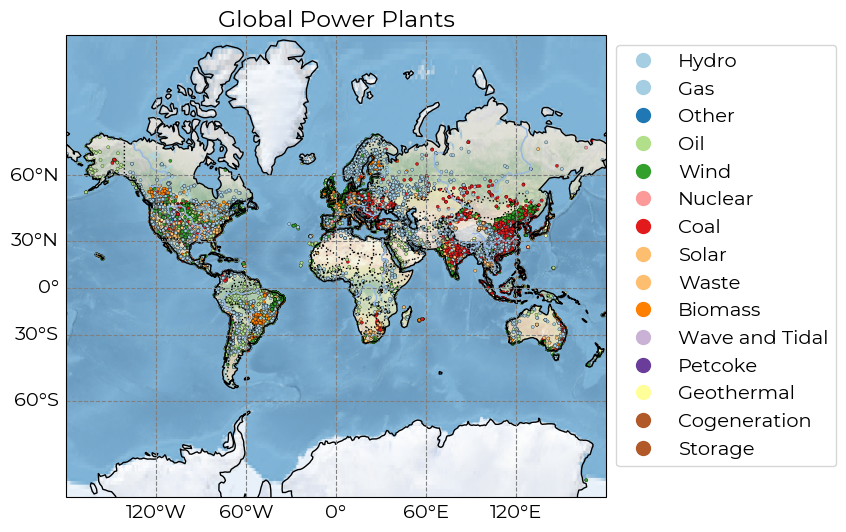

In [4]:
levels, categories = pd.factorize(power_plants[f"Primary Fuel"])

num_categories = len(categories)

cmap_name = 'Paired'

cmap = plt.cm.get_cmap(cmap_name, num_categories)

_map = plot_map(f"Global Power Plants",
             power_plants['Longitude'],
             power_plants['Latitude'],
             c=levels,
             labels=categories,
             cmap=cmap,
             s=5,
             edgecolor='black',
             linewidths=0.2)

In [5]:
# reference https://www.iea.org/reports/global-energy-review-2025/electricity

In [6]:
# reference https://www.eia.gov/todayinenergy/detail.php?id=28392  62,500 power plants ~6,000 TW in 2015

In [7]:
# reference https://www.eia.gov/international/data/world/electricity/electricity-capacity?pd=2&p=0000000000000000000007vo7&u=0&f=A&v=mapbubble&a=-&i=none&vo=value&t=C&g=00000000000000000000000000000000000000000000000001&l=249-ruvvvvvfvtvnvv1vrvvvvfvvvvvvfvvvou20evvvvvvvvvvnvvvs0008&s=315532800000&e=1672531200000
# 2023 capacity 9090 TW in 2023

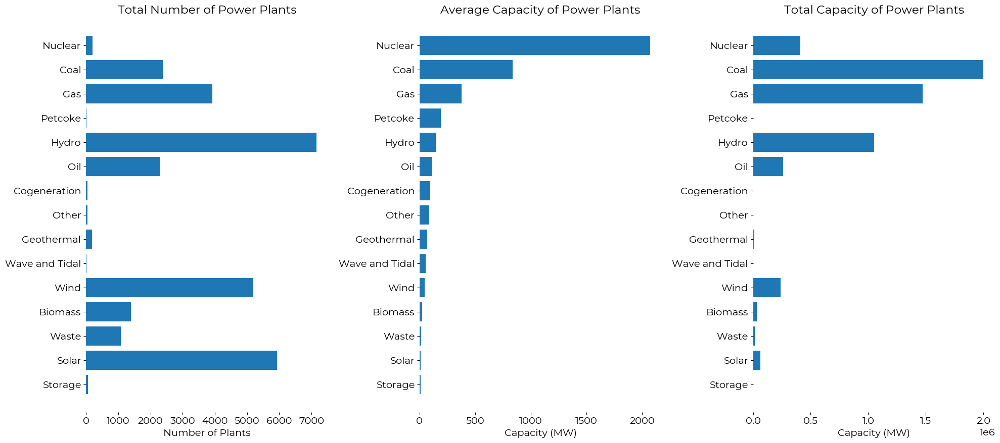

In [8]:
# =============================================================================
# Code generated by Artificial Intelligence (Google AI)
# Date: 2025-12-09
# Prompt: "Build a barh plot with [...]."
# =============================================================================
# Assuming 'power_plants' DataFrame is already defined and loaded
# Example of how 'power_plants' might look for demonstration purposes:
# data = {'Primary Fuel': ['Solar', 'Gas', 'Hydro', 'Solar', 'Gas', 'Hydro', 'Gas'],
#         'Capacity (MW)': [50, 200, 500, 75, 150, 450, 300]}
# power_plants = pd.DataFrame(data)


fig = plt.figure(figsize=(20, 9))

# Create the two subplots, explicitly sharing the Y-axis using sharey=True

_average_capacity = fig.add_subplot(132)
_number_of_plants = fig.add_subplot(131, sharey=_average_capacity)
_total_capacity = fig.add_subplot(133, sharey=_average_capacity)

# --- Process Data ---
number_of_plants_series = power_plants.groupby('Primary Fuel')['Capacity (MW)'].count()
average_capacity_series = power_plants.groupby('Primary Fuel')['Capacity (MW)'].mean()
total_capacity_series = power_plants.groupby('Primary Fuel')['Capacity (MW)'].sum() # Use .sum() for total capacity

# --- Key Step: Determine the desired order from the first plot ---
# Sort the average capacity and capture the sorted index (e.g., ['Solar', 'Gas', 'Hydro'])
sorted_fuel_order = average_capacity_series.sort_values(ascending=True).index

number_of_plants_ordered = number_of_plants_series.reindex(sorted_fuel_order)

_number_of_plants.barh(number_of_plants_ordered.index,
                       number_of_plants_ordered.values)

# --- Plot 1: Average Capacity (Already sorted by its values) ---
_average_capacity.barh(average_capacity_series.sort_values(ascending=True).index,
                       average_capacity_series.sort_values(ascending=True))

_average_capacity.set_title("Average Capacity of Power Plants")
_average_capacity.set_xlabel("Capacity (MW)", fontsize=14, fontweight='bold') # Corrected syntax


# --- Plot 2: Total Capacity (Reorder to match Plot 1's order) ---

# Reindex the total capacity series using the order captured from the average capacity plot
total_capacity_ordered = total_capacity_series.reindex(sorted_fuel_order)

_total_capacity.barh(total_capacity_ordered.index,
                     total_capacity_ordered.values)

_total_capacity.set_title("Total Capacity of Power Plants")
_number_of_plants.set_title("Total Number of Power Plants")

_total_capacity.set_xlabel("Capacity (MW)", fontsize=14, fontweight='bold') # Corrected syntax
_number_of_plants.set_xlabel("Number of Plants", fontsize=14, fontweight='bold') # Corrected syntax
# We don't need a ylabel here because it shares the Y-axis labels with the left plot

# Use tight_layout to prevent titles/labels from overlapping
plt.tight_layout()

# Method 1: Using Seaborn's despine function (easiest way)
sns.despine(ax=_number_of_plants, top=True, right=True, left=True, bottom=True)
sns.despine(ax=_average_capacity, top=True, right=True, left=True, bottom=True)
sns.despine(ax=_total_capacity, top=True, right=True, left=True, bottom=True)
# Note: For horizontal bars, you might only want to remove 'top' and 'right' 
# spines to keep the main axes lines for context. E.g., sns.despine(ax=ax, top=True, right=True)

# Ensure the plots are displayed
plt.show()


Use the above plots to compare different power plants. All power plants come with advantages and disadvantages.

In [9]:
# todo do a stacked barchart and see if it is better visually

In [10]:
power_plants['Capacity (MW)'].sum() # data quality issue, verification not too far off.

5572077.7622569995

<br><br><br><h2>Global Population</h2>

In [11]:
population_df = pd.read_csv('../final_project/data/population.csv', index_col=0)

population_df['Longitude'] = population_df['LONG']

population_df['Latitude'] = population_df['LAT']

print(f"{population_df.head()}")

      longitude      latitude  population       LONG        LAT  Longitude  \
0 -7.632827e+06 -3.850085e+06        19.0 -68.566853 -32.658667 -68.566853   
1 -7.629515e+06 -3.851092e+06       115.0 -68.537095 -32.666286 -68.537095   
2 -7.561388e+06 -3.777820e+06         4.0 -67.925100 -32.110468 -67.925100   
3 -7.591936e+06 -3.782031e+06        84.0 -68.199518 -32.142502 -68.199518   
4 -7.591313e+06 -3.782761e+06        82.0 -68.193925 -32.148056 -68.193925   

    Latitude  
0 -32.658667  
1 -32.666286  
2 -32.110468  
3 -32.142502  
4 -32.148056  


In [12]:
gdf_population = gpd.GeoDataFrame(
        population_df,
        geometry=gpd.points_from_xy(population_df.LONG, population_df.LAT),
        crs="EPSG:4326"
    )

In [13]:
population_sample = pd.read_csv('../final_project/data/population_sample.csv', index_col=0)

population_sample['Longitude'] = population_sample['LONG']

population_sample['Latitude'] = population_sample['LAT']

print(f"{population_sample.head()}")

            longitude      latitude  population        LONG        LAT  \
6776395  1.335439e+07  3.361337e+06       286.0  119.964569  28.887511   
3674609 -1.031141e+07  4.796022e+06         1.0  -92.628931  39.517152   
7632950  4.800321e+06  1.953138e+06       193.0   43.122018  17.277380   
6767970  1.280401e+07  3.227888e+06      2738.0  115.020421  27.832622   
7040086 -1.004965e+07  3.800617e+06       335.0  -90.277534  32.283768   

          Longitude   Latitude  
6776395  119.964569  28.887511  
3674609  -92.628931  39.517152  
7632950   43.122018  17.277380  
6767970  115.020421  27.832622  
7040086  -90.277534  32.283768  


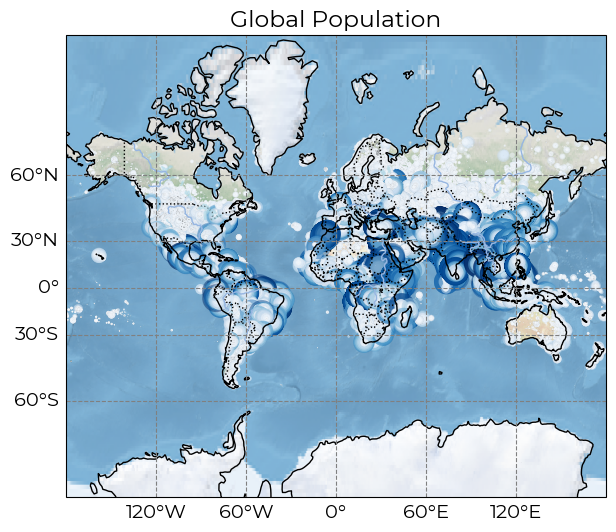

In [14]:
_pop = plot_map(f"Global Population",
             population_df['LONG'],
             population_df['LAT'],
             c=population_df['population'],
             labels=None,
             cmap='Blues',
             s=population_df['population']/100,
             edgecolor='black',
             linewidths=.005,
             alpha=0.5)

In [15]:
population_sum = population_df['population'].sum()

print(f"{population_sum:,.0f}")

5,948,700,232


According to (Láng-Ritter, Keskinen, and Tenkanen 2025), global populations are systematically underestimated. 

#referenceLáng-Ritter, J., Keskinen, M. & Tenkanen, H. Global gridded population datasets systematically underrepresent rural population. Nat Commun 16, 2170 (2025). https://doi.org/10.1038/s41467-025-56906-7

https://www.nature.com/articles/s41467-025-56906-7

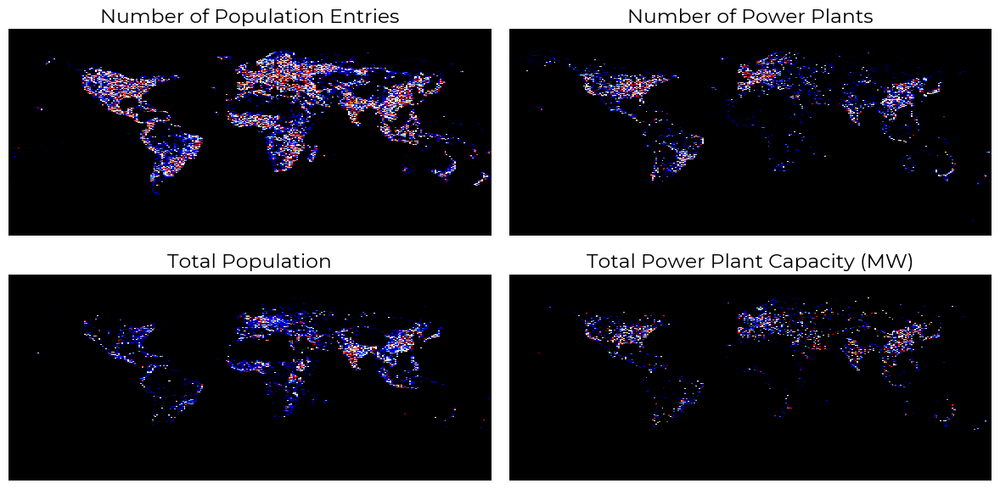

In [16]:
pixel_dict = plot_global_pixelated_heatmaps(population_df,
                               power_plants,
                               resolution=300,
                               cmap='flag_r')

Some interesting aspects of the map can be observed.

The most obvious, <i>and mostly the motivation for synthesizing this dataset</i>, is the areas that are underserved by electrification. This can be seen in both the number of power plants per tile of land and the sum capacity of all of those power plants.
<font size=4></font><br>



<br><br><br><h2>Atmospheric Data</h2>

In [17]:
ncei_atmospheric = pd.read_csv('data/full_atmospheric.csv', index_col=0)

print(f"{ncei_atmospheric.head()}")

                                            1_TEMP     2_TEMP     3_TEMP  \
NAME                                                                       
068 BAFFIN BAY POINT OF ROCKS TX, TX US  55.030645  61.121053  67.901724   
9014098 FORT GRATIOT MI, US              24.872581  29.710714  39.132759   
9052030 OSWEGO NY, US                    27.512903  30.026786  39.381034   
9063020 BUFFALO NY, US                   27.285484  29.584211  37.920690   
9075014 HARBOR BEACH MI, US              24.391935  28.058929  35.505172   

                                            4_TEMP     5_TEMP     6_TEMP  \
NAME                                                                       
068 BAFFIN BAY POINT OF ROCKS TX, TX US  73.383333  79.854098  83.390000   
9014098 FORT GRATIOT MI, US              46.596491  55.336066  67.819643   
9052030 OSWEGO NY, US                    46.408929  57.111475  67.585000   
9063020 BUFFALO NY, US                   45.516667  57.940984  67.696667   
9075014 HAR

In [18]:
ncei_stations_id = pd.read_csv('data/ncei_stations_id.csv', index_col=0)

print(f"{ncei_stations_id}")

           STATION   LATITUDE   LONGITUDE  ELEVATION  \
0      57328099999  31.200000  107.500000     344.00   
1      71393099999  51.100000 -114.000000    1081.00   
2      72210103039  37.450000 -106.800000    3593.90   
3      71670099999  46.770000  -65.000000      34.00   
4       3141299999  60.683333   -2.533333     470.00   
...            ...        ...         ...        ...   
12545  60571099999  31.645744   -2.269861     811.07   
12546  40439099999  24.144244   38.063350       7.92   
12547  17099099999  39.650000   43.033333    1664.81   
12548  41216399999  24.509936   52.335222      25.00   
12549  94105099999 -12.616667  131.050000      17.50   

                                             NAME  
0                                     DA XIAN, CH  
1                    CALGARY INTERNATIONAL CS, CA  
2                          WOLF CREEK PASS, CO US  
3                            KOUCHIBOUGUAC CS, CA  
4                          CLAIR OIL PLATFORM, UK  
...            

In [19]:
ncei_atmospheric_raw = pd.read_csv('data/ncei_atmospheric_raw.csv', index_col=0)

print(f"{ncei_atmospheric_raw.head()}")

       STATION        DATE  LATITUDE  LONGITUDE  ELEVATION  \
0  99471099999  2024-01-01      27.3     -97.42        4.0   
1  99471099999  2024-02-01      27.3     -97.42        4.0   
2  99471099999  2024-03-01      27.3     -97.42        4.0   
3  99471099999  2024-04-01      27.3     -97.42        4.0   
4  99471099999  2024-05-02      27.3     -97.42        4.0   

                                      NAME       TEMP  TEMP_ATTRIBUTES  DEWP  \
0  068 BAFFIN BAY POINT OF ROCKS TX, TX US  55.030645        22.016129   NaN   
1  068 BAFFIN BAY POINT OF ROCKS TX, TX US  61.121053        21.631579   NaN   
2  068 BAFFIN BAY POINT OF ROCKS TX, TX US  67.901724        22.293103   NaN   
3  068 BAFFIN BAY POINT OF ROCKS TX, TX US  73.383333        21.783333   NaN   
4  068 BAFFIN BAY POINT OF ROCKS TX, TX US  79.854098        22.344262   NaN   

   DEWP_ATTRIBUTES  ...        MAX  MAX_ATTRIBUTES        MIN  MIN_ATTRIBUTES  \
0              0.0  ...  61.566129               *  50.375806    

In [20]:
full_atmospheric_w_id = ncei_atmospheric.merge(ncei_stations_id, on='NAME', how='left')

print(f"{full_atmospheric_w_id.head()}")

                                      NAME     1_TEMP     2_TEMP     3_TEMP  \
0  068 BAFFIN BAY POINT OF ROCKS TX, TX US  55.030645  61.121053  67.901724   
1              9014098 FORT GRATIOT MI, US  24.872581  29.710714  39.132759   
2                    9052030 OSWEGO NY, US  27.512903  30.026786  39.381034   
3                   9063020 BUFFALO NY, US  27.285484  29.584211  37.920690   
4              9075014 HARBOR BEACH MI, US  24.391935  28.058929  35.505172   

      4_TEMP     5_TEMP     6_TEMP     7_TEMP     8_TEMP     9_TEMP  ...  \
0  73.383333  79.854098  83.390000  82.854839  84.477778  81.543333  ...   
1  46.596491  55.336066  67.819643  71.725806  71.140741  66.320000  ...   
2  46.408929  57.111475  67.585000  73.332258  70.574074  65.746667  ...   
3  45.516667  57.940984  67.696667  73.688710  71.751852  67.973333  ...   
4  43.260000  51.595082  63.859322  69.646774  69.653704  65.363333  ...   

   8_PRCP  9_PRCP  10_PRCP  11_PRCP  12_PRCP  labels      STATION  L

In [21]:
ncei_atmospheric_raw['DATETIME'] = pd.to_datetime(ncei_atmospheric_raw['DATE'])

print(f"{ncei_atmospheric_raw.head()}")

       STATION        DATE  LATITUDE  LONGITUDE  ELEVATION  \
0  99471099999  2024-01-01      27.3     -97.42        4.0   
1  99471099999  2024-02-01      27.3     -97.42        4.0   
2  99471099999  2024-03-01      27.3     -97.42        4.0   
3  99471099999  2024-04-01      27.3     -97.42        4.0   
4  99471099999  2024-05-02      27.3     -97.42        4.0   

                                      NAME       TEMP  TEMP_ATTRIBUTES  DEWP  \
0  068 BAFFIN BAY POINT OF ROCKS TX, TX US  55.030645        22.016129   NaN   
1  068 BAFFIN BAY POINT OF ROCKS TX, TX US  61.121053        21.631579   NaN   
2  068 BAFFIN BAY POINT OF ROCKS TX, TX US  67.901724        22.293103   NaN   
3  068 BAFFIN BAY POINT OF ROCKS TX, TX US  73.383333        21.783333   NaN   
4  068 BAFFIN BAY POINT OF ROCKS TX, TX US  79.854098        22.344262   NaN   

   DEWP_ATTRIBUTES  ...        MAX  MAX_ATTRIBUTES        MIN  MIN_ATTRIBUTES  \
0              0.0  ...  61.566129               *  50.375806    

In [22]:
ncei_atmospheric_raw['MONTH'] = ncei_atmospheric_raw['DATETIME'].dt.month

print(f"{ncei_atmospheric_raw.head()}")

       STATION        DATE  LATITUDE  LONGITUDE  ELEVATION  \
0  99471099999  2024-01-01      27.3     -97.42        4.0   
1  99471099999  2024-02-01      27.3     -97.42        4.0   
2  99471099999  2024-03-01      27.3     -97.42        4.0   
3  99471099999  2024-04-01      27.3     -97.42        4.0   
4  99471099999  2024-05-02      27.3     -97.42        4.0   

                                      NAME       TEMP  TEMP_ATTRIBUTES  DEWP  \
0  068 BAFFIN BAY POINT OF ROCKS TX, TX US  55.030645        22.016129   NaN   
1  068 BAFFIN BAY POINT OF ROCKS TX, TX US  61.121053        21.631579   NaN   
2  068 BAFFIN BAY POINT OF ROCKS TX, TX US  67.901724        22.293103   NaN   
3  068 BAFFIN BAY POINT OF ROCKS TX, TX US  73.383333        21.783333   NaN   
4  068 BAFFIN BAY POINT OF ROCKS TX, TX US  79.854098        22.344262   NaN   

   DEWP_ATTRIBUTES  ...        MAX  MAX_ATTRIBUTES        MIN  MIN_ATTRIBUTES  \
0              0.0  ...  61.566129               *  50.375806    

In [23]:
ncei_atmospheric_raw[ncei_atmospheric_raw==999.9] = np.nan

ncei_atmospheric_raw[ncei_atmospheric_raw==9999.9] = np.nan

print(f"{ncei_atmospheric_raw.head()}")

       STATION        DATE  LATITUDE  LONGITUDE  ELEVATION  \
0  99471099999  2024-01-01      27.3     -97.42        4.0   
1  99471099999  2024-02-01      27.3     -97.42        4.0   
2  99471099999  2024-03-01      27.3     -97.42        4.0   
3  99471099999  2024-04-01      27.3     -97.42        4.0   
4  99471099999  2024-05-02      27.3     -97.42        4.0   

                                      NAME       TEMP  TEMP_ATTRIBUTES  DEWP  \
0  068 BAFFIN BAY POINT OF ROCKS TX, TX US  55.030645        22.016129   NaN   
1  068 BAFFIN BAY POINT OF ROCKS TX, TX US  61.121053        21.631579   NaN   
2  068 BAFFIN BAY POINT OF ROCKS TX, TX US  67.901724        22.293103   NaN   
3  068 BAFFIN BAY POINT OF ROCKS TX, TX US  73.383333        21.783333   NaN   
4  068 BAFFIN BAY POINT OF ROCKS TX, TX US  79.854098        22.344262   NaN   

   DEWP_ATTRIBUTES  ...        MAX  MAX_ATTRIBUTES        MIN  MIN_ATTRIBUTES  \
0              0.0  ...  61.566129               *  50.375806    

In [24]:
aggregate_function = {'STATION' : 'first',
                'DATE'    : 'first',
                'LATITUDE' : 'mean',
                'LONGITUDE' : 'mean',
                'ELEVATION' : 'mean',
                'NAME' : 'first',
                'TEMP' : 'mean',
                'TEMP_ATTRIBUTES' : 'mean',
                'DEWP' : 'mean',
                'DEWP_ATTRIBUTES' : 'mean',
                'SLP' : 'mean',
                'SLP_ATTRIBUTES' : 'mean',
                'STP' : 'mean',
                'STP_ATTRIBUTES' : 'mean',
                'VISIB' : 'mean',
                'VISIB_ATTRIBUTES' : 'mean',
                'WDSP' : 'mean',
                'WDSP_ATTRIBUTES' : 'mean',
                'MXSPD' : 'mean',
                'GUST' : 'mean',
                'MAX' : 'mean',
                'MAX_ATTRIBUTES' : 'first',
                'MIN' : 'mean',
                'MIN_ATTRIBUTES' : 'first',
                'PRCP' : 'mean',
                'PRCP_ATTRIBUTES' : 'first',
                'SNDP' : 'mean',
                'FRSHTT' : 'first',
                'DATETIME' : 'first',
                'MONTH' : 'first'}

In [25]:
ncei_atmospheric_aggregate = ncei_atmospheric_raw.groupby(['NAME', 'MONTH']).agg(aggregate_function)
#data quality issue
ncei_atmospheric_aggregate = ncei_atmospheric_aggregate.fillna(0)

print(f"{ncei_atmospheric_aggregate.head()}")

                                                   STATION        DATE  \
NAME                                    MONTH                            
068 BAFFIN BAY POINT OF ROCKS TX, TX US 1      99471099999  2024-01-01   
                                        2      99471099999  2024-02-01   
                                        3      99471099999  2024-03-01   
                                        4      99471099999  2024-04-01   
                                        5      99471099999  2024-05-02   

                                               LATITUDE  LONGITUDE  ELEVATION  \
NAME                                    MONTH                                   
068 BAFFIN BAY POINT OF ROCKS TX, TX US 1          27.3     -97.42        4.0   
                                        2          27.3     -97.42        4.0   
                                        3          27.3     -97.42        4.0   
                                        4          27.3     -97.42        4.

<h3>Step 2: Unsupervised Feature Discovery</h3>

Use unsupervised learning to discover features that will improve your predictions. You must complete ONE of these (you may do both if you wish, but must fully complete at least one):

<h4>Option A: Clustering</h4>
Try at least 3-4 different values of k (e.g., k=2, 3, 4, 5) and use the elbow method or silhouette scores to select the optimal number<br>
Use the elbow method or silhouette scores to help decide<br>
Minimum 4 visualizations required:<br>

[x]Elbow plot or silhouette plot<br>
[x]Scatter plot showing your final clusters (color-coded)<br>
[x]At least 2 additional visualizations comparing clusters (box plots, bar charts, heatmaps showing cluster characteristics)<br>
[ ]Describe each cluster: What makes this group different? Give them meaningful names that reflect their characteristics. Think ahead: How might cluster membership help you predict your target variable in Phase 2?<br>

Examples of good cluster names:<br>

✅ "Budget-conscious families" (not "Cluster 1")<br>
✅ "Premium business travelers" (not "High-value customers")<br>
✅ "Occasional weekend shoppers" (not "Low-frequency segment")<br>
Examples of poor cluster names:<br>

❌ "Cluster 1", "Cluster 2"<br>
❌ "High-value customers" (too generic)<br>
❌ "Group A" (not descriptive)<br>

Critical Requirement: You must explain what you discovered in words a non-technical person would understand. What hidden groups or patterns exist in your data? Most importantly: How will these discoveries help you make better predictions?<br>

Important Note: If your initial unsupervised analysis doesn't reveal clear patterns, document this! Try different preprocessing (scaling, feature selection) or different methods. Sometimes discovering "no clear patterns" is valuable learning. Explain why patterns might not exist in your data and what this means for your predictive models.<br>

<br><br><br><h2>Mapping Potential Clusters based on Atmospheric Data</h2>

<h4>Temperature</h4>
The rainforest biome remains warm all year and must stay frost-free. The average daily temperatures range from 20°C (68°F) to 25°C (77°F).

<h4>Precipitation</h4>
Rainforests receive the most rain of all of the biomes in a year! A typical year sees 2,000 to 10,000 millimeters (79 to 394 inches) of rain per year.

https://earthobservatory.nasa.gov/biome/biorainforest.php

In [26]:
ncei_atmospheric_temp_precip = ncei_atmospheric_aggregate.groupby(level='NAME').agg(
    Min_Temp_F=('TEMP', 'min'),
    Min_Precip_In=('PRCP', 'min')
)

print(f"{ncei_atmospheric_temp_precip.head()}")

                                         Min_Temp_F  Min_Precip_In
NAME                                                              
068 BAFFIN BAY POINT OF ROCKS TX, TX US   55.030645            0.0
9014098 FORT GRATIOT MI, US               24.872581            0.0
9052030 OSWEGO NY, US                     27.512903            0.0
9063020 BUFFALO NY, US                    27.285484            0.0
9075014 HARBOR BEACH MI, US               24.391935            0.0


In [27]:
tropical_rainforest_temperature = (ncei_atmospheric_temp_precip['Min_Precip_In'] > 0.079)

tropical_rainforest_precipitation = (ncei_atmospheric_temp_precip['Min_Temp_F'] > 68)

tropical_rainforests_df = ncei_atmospheric_temp_precip[tropical_rainforest_temperature &
                                                       tropical_rainforest_precipitation]

print(f"{tropical_rainforests_df.head()}")

                                 Min_Temp_F  Min_Precip_In
NAME                                                      
APIA UPOLU ISLAND, WS             79.579630       0.090185
AUKI, BP                          79.956250       0.154643
BABELTHUAP KOROR AIRPORT, PW PS   81.059649       0.226780
BAHIR DAR, ET                     69.900000       0.120000
BALER RADAR, RP                   75.838710       0.116885


In [28]:
ncei_atmospheric_aggregate.reset_index(drop=True,inplace=True)

In [29]:
ncei_atmospheric_aggregate.to_csv('data/ncei_atmospheric_aggregate.csv')

In [30]:
tropical_rainforests_df = tropical_rainforests_df.merge(ncei_atmospheric_aggregate.groupby('NAME').head(1),
                                                        on='NAME',
                                                        how='inner')

print(f"{tropical_rainforests_df.head()}")

                              NAME  Min_Temp_F  Min_Precip_In      STATION  \
0            APIA UPOLU ISLAND, WS   79.579630       0.090185  91762099999   
1                         AUKI, BP   79.956250       0.154643  91507099999   
2  BABELTHUAP KOROR AIRPORT, PW PS   81.059649       0.226780  91408040310   
3                    BAHIR DAR, ET   69.900000       0.120000  63332099999   
4                  BALER RADAR, RP   75.838710       0.116885  98334099999   

         DATE   LATITUDE   LONGITUDE  ELEVATION       TEMP  TEMP_ATTRIBUTES  \
0  2024-01-01 -13.800000 -171.783333       2.00  81.937097         7.629032   
1  2024-01-05  -8.783333  160.733333      11.00  82.355102         5.448980   
2  2024-01-01   7.367220  134.544170      53.60  81.519355        24.000000   
3  2024-07-17  11.608075   37.321644    1822.09  69.900000         4.666667   
4  2024-01-01  15.750000  121.633333     178.00  75.838710         7.838710   

   ...        MAX  MAX_ATTRIBUTES        MIN  MIN_ATTRIB

In [31]:
full_atmospheric_w_id.to_csv('data/full_atmospheric_w_id.csv')

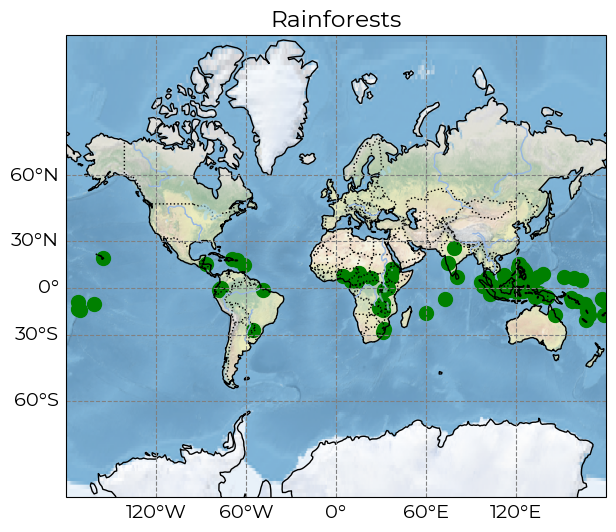

In [32]:
_rainforest = plot_map('Rainforests',
         tropical_rainforests_df['LONGITUDE'],
         tropical_rainforests_df['LATITUDE'],
         c='green',
         labels=None,
         cmap=False,
         s=100)

<center><h4>NASA Rainforest Map</h4></center>
<img height=1800 width=3600 src='data/nasa-map-rainforest.jpg'></img>

The above maps should at least prove that clustering based on NCEI atmospheric data is possible.

In [33]:
# --- 1. Pivot the 'TEMP' column ---
temp_pivot = ncei_atmospheric_aggregate.pivot_table(
    index='NAME',       # The row labels will be the station names
    columns='MONTH',    # The new columns will be the month numbers (1-12)
    values='TEMP',      # The data to fill the cells will come from the 'TEMP' column
    aggfunc='mean'      # If a station has multiple entries for a month, take the average
)

temp_pivot.columns = [str(i)+'_TEMP' for i in range(1,13)]

print("Temperature Pivot Table:")
print(temp_pivot.head())

# --- 2. Pivot the 'PRCP' column ---
precip_pivot = ncei_atmospheric_aggregate.pivot_table(
    index='NAME',       # Row labels
    columns='MONTH',    # Column labels (1-12)
    values='PRCP',      # Data to fill cells
    aggfunc='mean'       # Typically aggregate precipitation by summing the month's total
)

precip_pivot.columns = [str(i)+'_PRCP' for i in range(1,13)]

print("\nPrecipitation Pivot Table:")

print(precip_pivot.head())

Temperature Pivot Table:
                                            1_TEMP     2_TEMP     3_TEMP  \
NAME                                                                       
068 BAFFIN BAY POINT OF ROCKS TX, TX US  55.030645  61.121053  67.901724   
9014098 FORT GRATIOT MI, US              24.872581  29.710714  39.132759   
9052030 OSWEGO NY, US                    27.512903  30.026786  39.381034   
9063020 BUFFALO NY, US                   27.285484  29.584211  37.920690   
9075014 HARBOR BEACH MI, US              24.391935  28.058929  35.505172   

                                            4_TEMP     5_TEMP     6_TEMP  \
NAME                                                                       
068 BAFFIN BAY POINT OF ROCKS TX, TX US  73.383333  79.854098  83.390000   
9014098 FORT GRATIOT MI, US              46.596491  55.336066  67.819643   
9052030 OSWEGO NY, US                    46.408929  57.111475  67.585000   
9063020 BUFFALO NY, US                   45.516667  57.940984 

In [34]:
# data quality issue
monthly_pivot = pd.concat([temp_pivot, 
                           precip_pivot], axis=1)
# data quality issue
monthly_pivot = monthly_pivot[~np.isnan(monthly_pivot).any(axis=1)]

print(monthly_pivot.head())

                                            1_TEMP     2_TEMP     3_TEMP  \
NAME                                                                       
068 BAFFIN BAY POINT OF ROCKS TX, TX US  55.030645  61.121053  67.901724   
9014098 FORT GRATIOT MI, US              24.872581  29.710714  39.132759   
9052030 OSWEGO NY, US                    27.512903  30.026786  39.381034   
9063020 BUFFALO NY, US                   27.285484  29.584211  37.920690   
9075014 HARBOR BEACH MI, US              24.391935  28.058929  35.505172   

                                            4_TEMP     5_TEMP     6_TEMP  \
NAME                                                                       
068 BAFFIN BAY POINT OF ROCKS TX, TX US  73.383333  79.854098  83.390000   
9014098 FORT GRATIOT MI, US              46.596491  55.336066  67.819643   
9052030 OSWEGO NY, US                    46.408929  57.111475  67.585000   
9063020 BUFFALO NY, US                   45.516667  57.940984  67.696667   
9075014 HAR

In [35]:
k_range = range(1, 35)

wcss = []

for n_clusters in k_range:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    kmeans.fit(monthly_pivot)
    wcss.append(kmeans.inertia_)
    
silhouette_scores = []

k_range_silhouette = range(2, 35)

for n_clusters in k_range_silhouette:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    
    cluster_labels = kmeans.fit_predict(monthly_pivot)
    
    score = silhouette_score(monthly_pivot, cluster_labels)
    
    silhouette_scores.append(score)

In [36]:
X = monthly_pivot

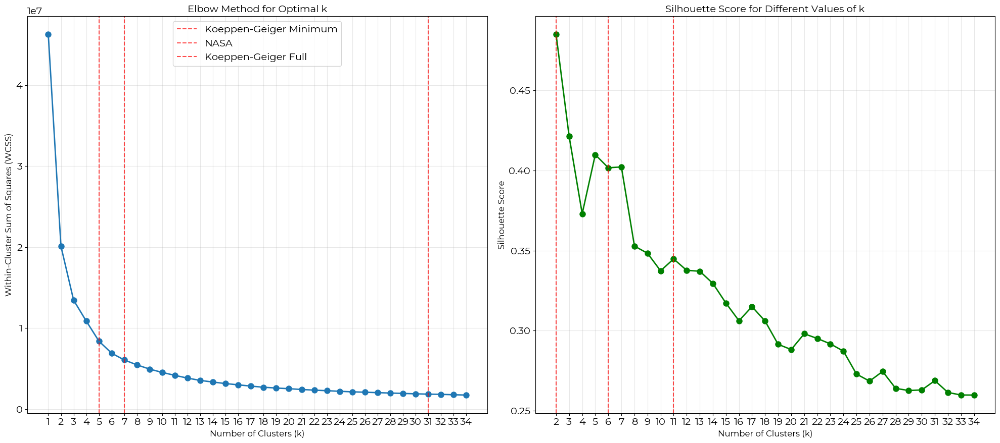

In [37]:
fig = plt.figure(figsize=(20, 9))

_elbow = fig.add_subplot(121)

_silhouette = fig.add_subplot(122)

_elbow.plot(k_range, wcss, marker='o', linewidth=2, markersize=8)

_elbow.set_xlabel('Number of Clusters (k)', fontsize=12)

_elbow.set_ylabel('Within-Cluster Sum of Squares (WCSS)', fontsize=12)

_elbow.set_title('Elbow Method for Optimal k', fontsize=14, fontweight='bold')

_elbow.grid(True, alpha=0.3)

_elbow.set_xticks(k_range)

_elbow.axvline(x=5, color='red', linestyle='--', alpha=0.7, label='Koeppen-Geiger Minimum')

_elbow.axvline(x=7, color='red', linestyle='--', alpha=0.7, label='NASA')

_elbow.axvline(x=31, color='red', linestyle='--', alpha=0.7, label='Koeppen-Geiger Full')

_elbow.legend()

_silhouette.grid(True, alpha=0.3)

_silhouette.plot(k_range_silhouette, silhouette_scores, marker='o', linewidth=2, markersize=8, color='green')

_silhouette.set_xlabel('Number of Clusters (k)', fontsize=12)

_silhouette.set_ylabel('Silhouette Score', fontsize=12)

_silhouette.set_title('Silhouette Score for Different Values of k', fontsize=14, fontweight='bold')

_silhouette.grid(True, alpha=0.3)

_silhouette.set_xticks(k_range_silhouette)

_silhouette.axvline(x=2, color='red', linestyle='--', alpha=0.7)

_silhouette.axvline(x=6, color='red', linestyle='--', alpha=0.7)

_silhouette.axvline(x=11, color='red', linestyle='--', alpha=0.7)

plt.tight_layout()

plt.show()

The elbow method doesn't show a clear line of diminishing returns. The existing Koeppen-Geiger climate classification has 5 main classifications with several subclassifications in each. The NASA map has 7 classifications.<br>

The silhouette score gives a better set of n_clusters=k. 

(write a blurb about Koeppen-Geiger classification system.)

In [38]:
k_values = [2, 5, 11]

<br><br><br>
<h2>Mapping Clusters And Assigning Them Names</h2>

<h3>Koeppen-Geiger Climate Classification</h3>

<img src='data/map-koeppen-geiger-globe.jpg'></img>

<br><br><br>
<h3>Climate Zones Based on NCEI Atmospheric Data and Kmeans Clustering</h3>

/var/folders/gl/919514x5085c7h3zzn_f471w0000gp/T/ipykernel_39067/777543930.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(cmap_name, num_categories)


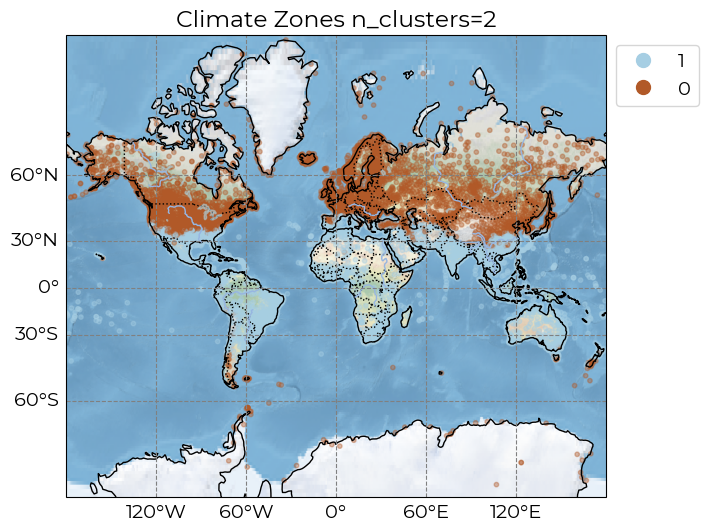

/var/folders/gl/919514x5085c7h3zzn_f471w0000gp/T/ipykernel_39067/777543930.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(cmap_name, num_categories)


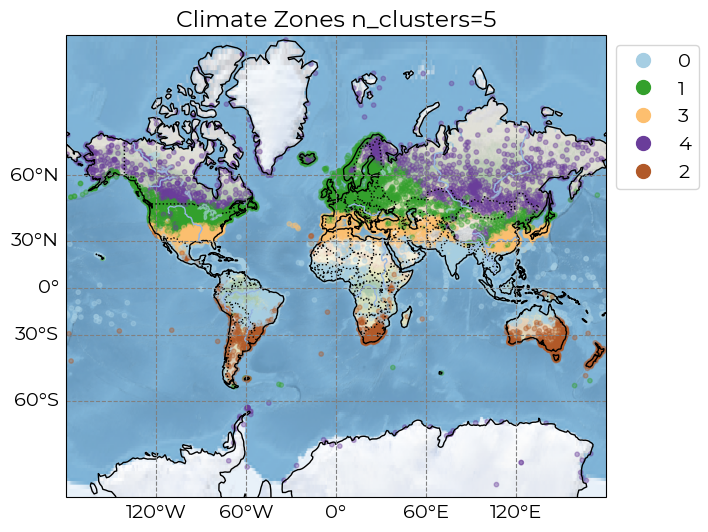

/var/folders/gl/919514x5085c7h3zzn_f471w0000gp/T/ipykernel_39067/777543930.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(cmap_name, num_categories)


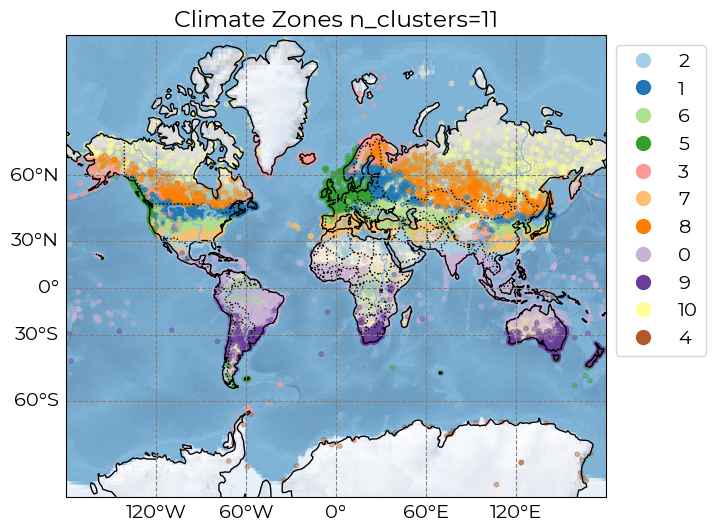

In [39]:
X = monthly_pivot.copy()

for n_clusters in k_values: 
    kmeans_3d_pred = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)

    labels_k = kmeans_3d_pred.fit_predict(X)

    monthly_pivot[f"CLIMATE ZONE n_clusters={n_clusters}"] = labels_k
    
    monthly_pivot_w_stations = monthly_pivot.merge(ncei_stations_id[['LONGITUDE','LATITUDE','NAME']],
                                                   on='NAME',
                                                   how='left')

    monthly_pivot_w_stations = monthly_pivot_w_stations.dropna()

    levels, categories = pd.factorize(monthly_pivot_w_stations[f"CLIMATE ZONE n_clusters={n_clusters}"])

    num_categories = len(categories)

    cmap_name = 'Paired'

    cmap = plt.cm.get_cmap(cmap_name, num_categories)

    _map = plot_map(f"Climate Zones n_clusters={n_clusters}",
             monthly_pivot_w_stations['LONGITUDE'],
             monthly_pivot_w_stations['LATITUDE'],
             c=levels,
             labels=categories,
             cmap=cmap,
             s=10,
             alpha=0.4)

<br><br><br>
<h3>Assigning Names and Color Schemes to the Cluster Climate Zones</h3>

<h4>Custom Clusters and Temperature and Precipitation Profiles</h4>

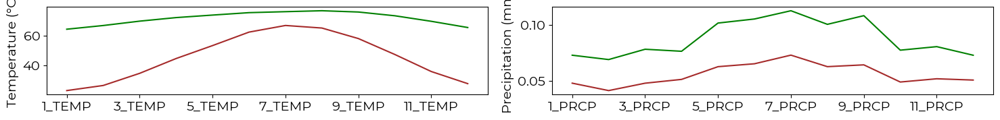

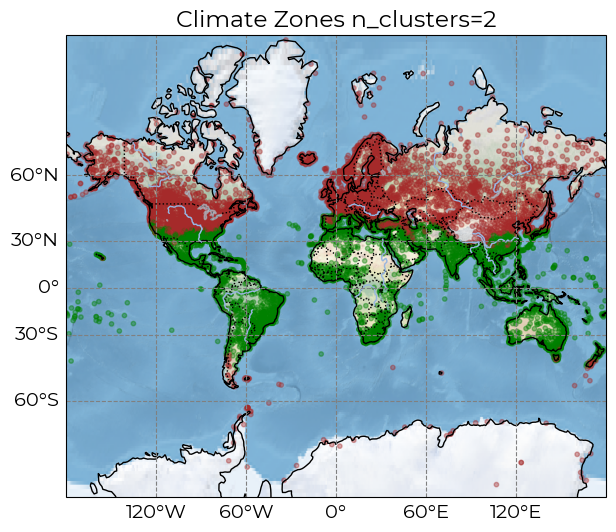

In [40]:
clusters_2 = OrderedDict({1 : {'name' : 'tropical', 'color' : 'green'},
              0 : {'name' : 'temperate',   'color' : 'brown'}
             })

map_match_labels(monthly_pivot, clusters_2)

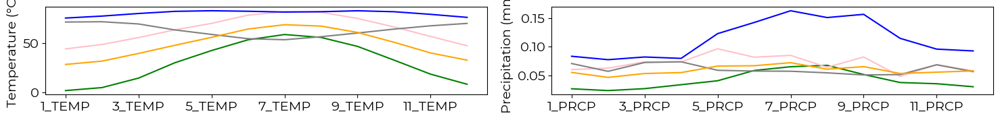

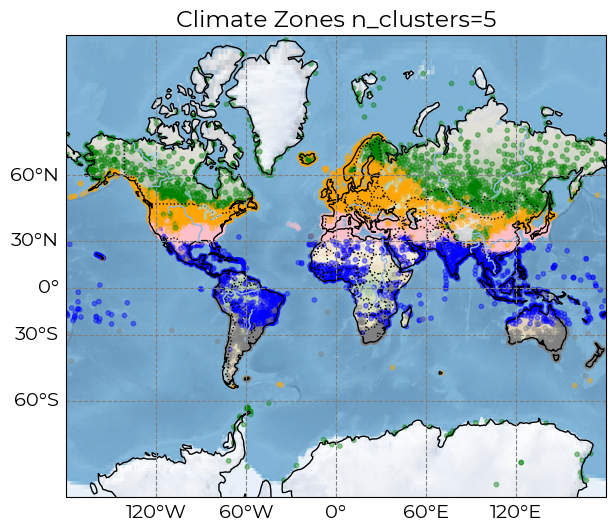

In [41]:
clusters_5 = OrderedDict({4 : {'name' : 'tropical rainforest', 'color' : 'green'},
              3 : {'name' : 'temperate north',   'color' : 'pink'},
              0 : {'name' : 'tundra',            'color' : 'blue'},
              2 : {'name' : 'temperate south',   'color' : 'gray'},
              1 : {'name' : 'mediterranean, hot and humid', 'color' : 'orange'}
             })

map_match_labels(monthly_pivot, clusters_5)

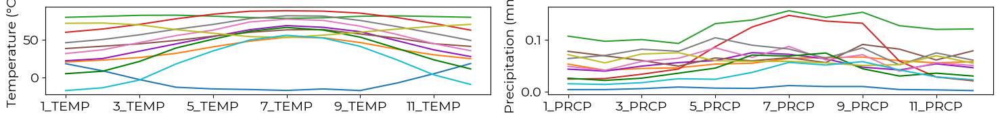

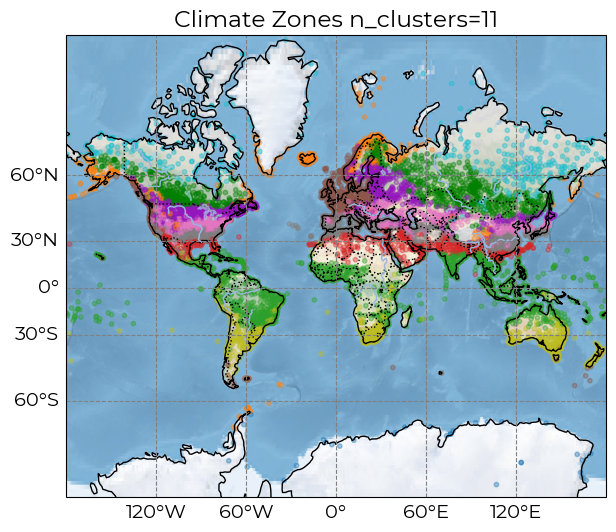

In [42]:
clusters_11 = OrderedDict({4 : {'name' : 'temperate forest', 'color' : '#1f77b4'},
              3 : {'name' : 'tropical rainforest',   'color' : '#ff7f0e'},
              0 : {'name' : 'mediterranean, hot and humid',            'color' : '#2ca02c'},
              2 : {'name' : 'temperate north',   'color' : '#d62728'},
              1 : {'name' : 'mediterranean, hot and humid', 'color' : '#9417bd'},
              5 : {'name' : 'antarctic', 'color' : '#8c564b'},
              6 : {'name' : 'temperate south', 'color' : '#e377c2'},
              7 : {'name' : 'tundra', 'color' : '#7f7f7f'},
              8 : {'name' : 'temperate rainforest', 'color' : 'green'},
              9 : {'name' : 'temperate', 'color' : '#bcbd22'},
              10 : {'name' : 'desert', 'color' : '#17becf'}
             })

map_match_labels(monthly_pivot, clusters_11)

<h4>Comparisons to Traditional and Standard Climate Maps</h4>

Below are a couple of maps to compare the clusters determined by the kmeans clustering model vs. some of the more traditional methods of delineating climate zones.

<br><br><br>

<center><h4>NASA Biomes Map</h4></center>

<center><img src='data/map-nasa-biomes.png' height=1800 width=3600></img></center>

<center><img src='data/labels-nasa-biome.png'></img></center>

<center><p style="font-size: 10px;">Source: National Aeronautics and Space Administration. (n.d.). Mission: Biomes. NASA Earth Observatory. https://earthobservatory.nasa.gov/biome</p></center>



<br><br><br><center><img src="imgs/Koppen-Geiger_Map_v2_World_1991–2020.png"></img></center>


<br><br><br>
<h4>Further Clustering on Existing Custom Climate Zones</h4>

One of the largest discrepancies is in the similarity of hot and humid climate zones with desert climate zones. In the n_clusters=5 model, hot and humid areas are grouped together with mediterranean areas.

^textually classifify climate zones, even based on Koeppen-Geiger.
Or, use the following plots.

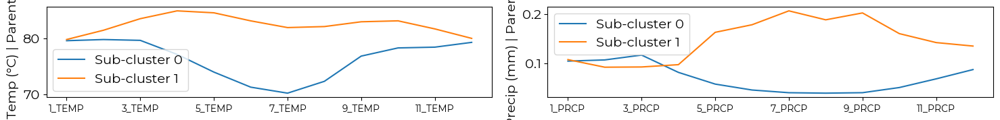

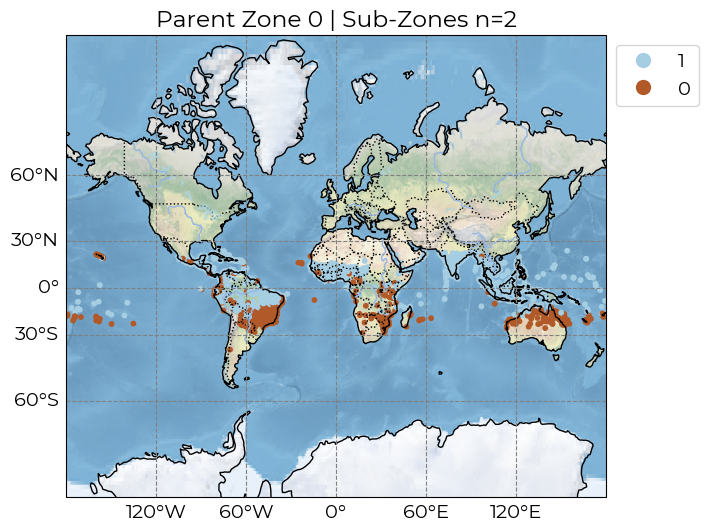

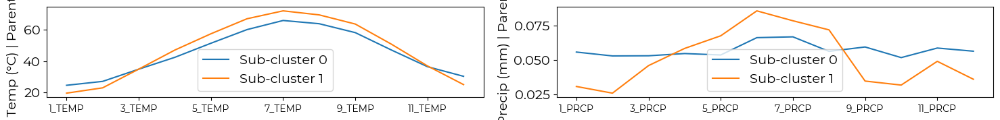

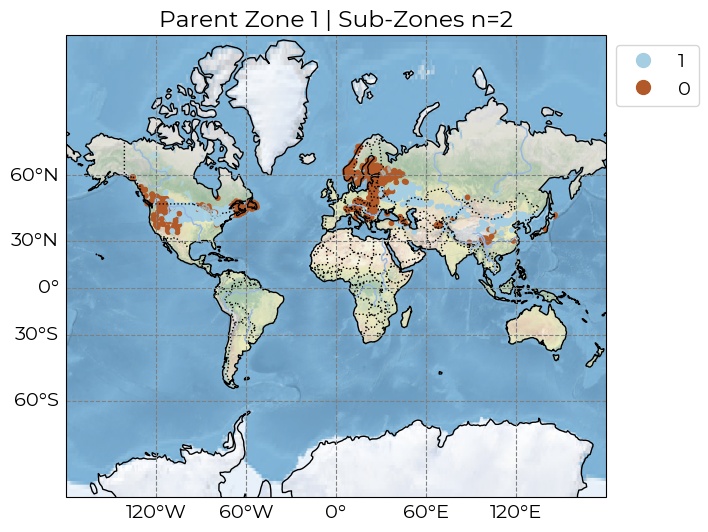

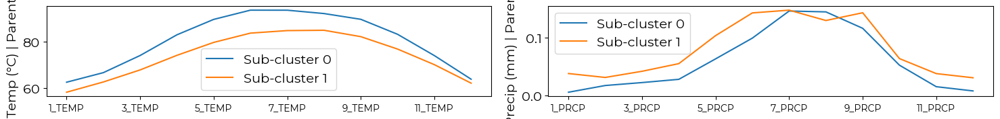

...

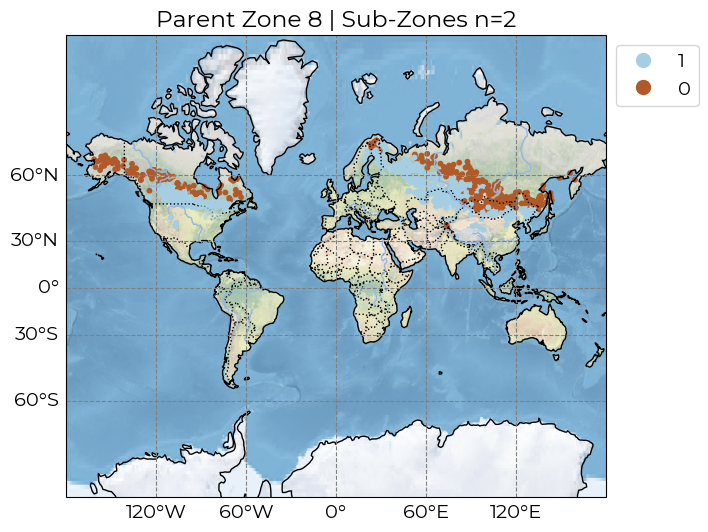

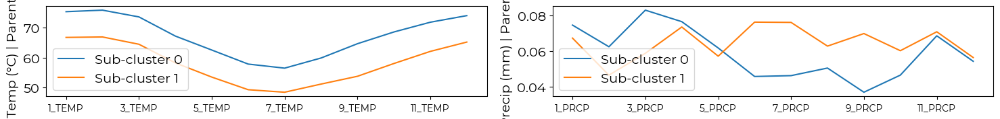

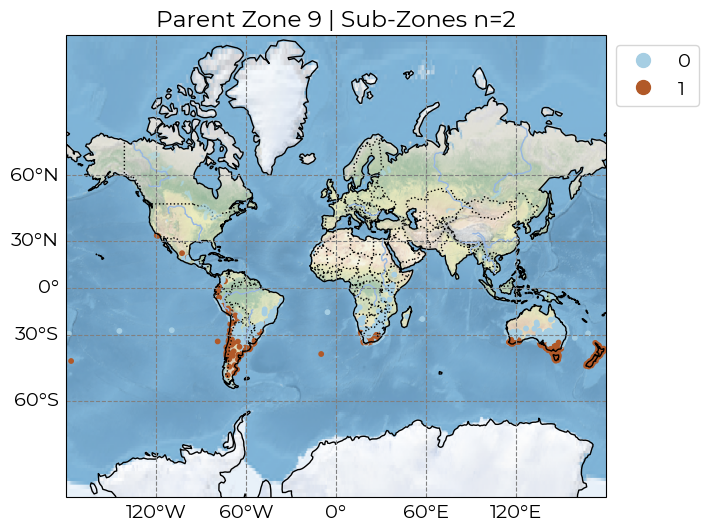

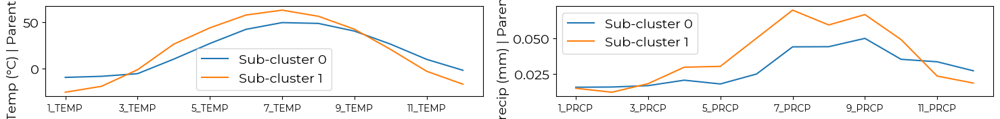

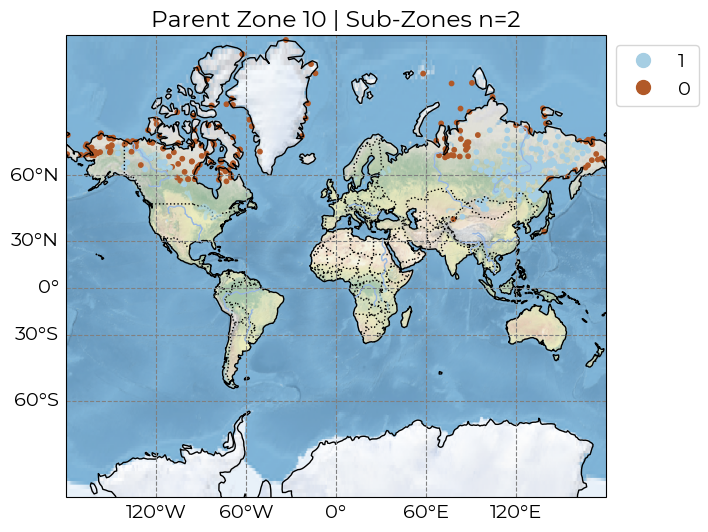

In [43]:
X_clusters = {}
n_clusters_outer = 11
n_clusters_inner = 2
cluster_outer_col = f"CLIMATE ZONE n_clusters={n_clusters_outer}"
cluster_inner_col = f"CLIMATE ZONE n_clusters={n_clusters_inner}"

# Assuming monthly_pivot, ncei_stations_id, temp_pivot, precip_pivot, plot_map are defined...

# Iterate through the initial 11 climate zones
for name, group in monthly_pivot.groupby(cluster_outer_col):
    X_clusters[name] = group
    
    # Process this specific cluster group immediately (remove the unnecessary inner 'for i in range()' loop)
    X_cluster = X_clusters[name]

    # --- Step 1: Sub-cluster this group ---
    kmeans_3d_pred = KMeans(n_clusters=n_clusters_inner, random_state=42, n_init=10)
    labels_k = kmeans_3d_pred.fit_predict(X_cluster)
    
    # Assign the new sub-cluster labels
    X_cluster[cluster_inner_col] = labels_k
        
    # --- Step 2: Merge with stations data ---
    X_cluster_w_stations = X_cluster.merge(ncei_stations_id[['LONGITUDE','LATITUDE','NAME']],
                                                       on='NAME',
                                                       how='left')
    X_cluster_w_stations = X_cluster_w_stations.dropna()

    # --- Step 3: Plot Temperature and Precipitation Profiles ---
    fig = plt.figure(figsize=(15,2))
    _temp = fig.add_subplot(121)
    _precip = fig.add_subplot(122)
    
    # Group by the new inner cluster ID (0 or 1)
    for j, group_j in X_cluster_w_stations.groupby(cluster_inner_col):
        # We need the mean across the time columns for plotting the profile
        temp_profile = group_j[temp_pivot.columns].mean()
        precip_profile = group_j[precip_pivot.columns].mean()
        
        # Plot using the calculated mean profile
        _temp.plot(temp_profile, label=f'Sub-cluster {j}') 
        _precip.plot(precip_profile, label=f'Sub-cluster {j}')
    
    # Customize plots
    _temp.set_ylabel(f"Temp (°C) | Parent {name}")
    plt.setp(_temp.get_xticklabels(), fontsize=10) # Set size/spacing on both
    _temp.set_xticks(_temp.get_xticks()[::2])  
    _temp.legend()
    
    _precip.set_ylabel(f"Precip (mm) | Parent {name}")
    plt.setp(_precip.get_xticklabels(), fontsize=10)
    _precip.set_xticks(_precip.get_xticks()[::2]) 
    _precip.legend()
    
    plt.tight_layout()
    plt.show()
    
    # --- Step 4: Plot Map ---
    levels, categories = pd.factorize(X_cluster_w_stations[cluster_inner_col])
    num_categories = len(categories)
    
    cmap_name = 'Paired'
    cmap = plt.get_cmap(cmap_name, num_categories)
    
    _map = plot_map(f"Parent Zone {name} | Sub-Zones n={n_clusters_inner}",
                 X_cluster_w_stations['LONGITUDE'],
                 X_cluster_w_stations['LATITUDE'],
                 c=levels,
                 labels=categories,
                 cmap=cmap,
                 s=10,
                 alpha=1)
    
    # Display the map for this sub-cluster iteration
    plt.show() 

The most basic clustering model returns with 2 fairly defined clusters. If you look at the map and the plot of average temperatures, it matches common sense. Temperatures rise during the middle of the year in the temperate climate zones and lower in the winter months.

Seems like temperature outweighs precipitation in the clustering model. For example, the northern parts of India are grouped in the same cluster as the deserts of the Middle East.

Rather than spend excessive amounts of time studying climate zones(although it is an interesting topic), I think I've answered the question about power plants and terrain. It makes immediate sense after seeing the plot of number of plants vs. average capacity vs. total capacity (figure ///) that the energy density of high capacity plants makes the determination of plant type to terrain less-than-accurate. Where renewables are concerned, the plant type to terrain prediction is typically accurate.

What the above plots show is that there are some clusters that could be divided even further. The silhouette score and elbow method of determining the optimal number of clusters could use improvement, as parent zones {0,1,2,3,4} demonstrate additional clustering potential. The temperature and precipitation profiles demonstrate large differences between subzones.

In [44]:
monthly_pivot.to_csv('data/monthly_pivot.csv')

<br><br><br><h3>Additional Visuals on Effectiveness of Clustering Models</h3>

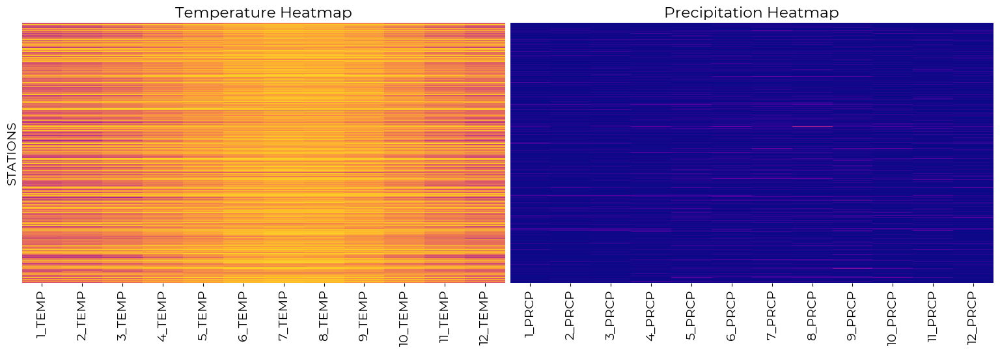

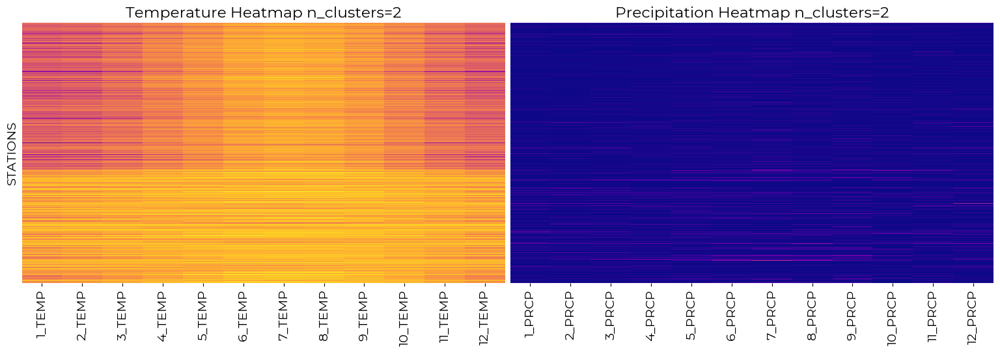

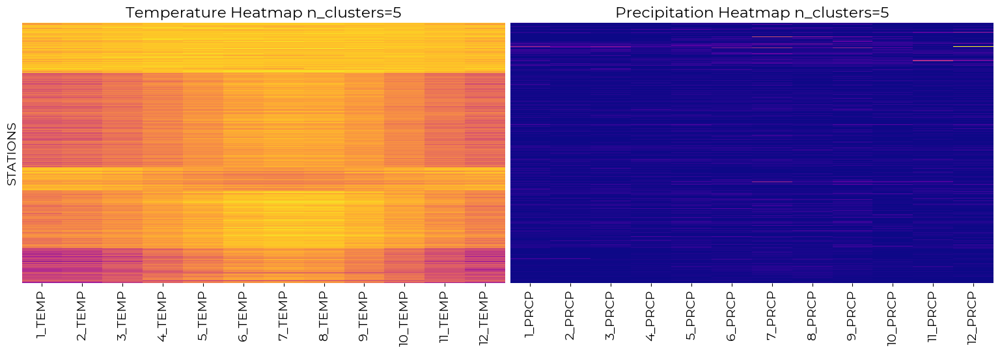

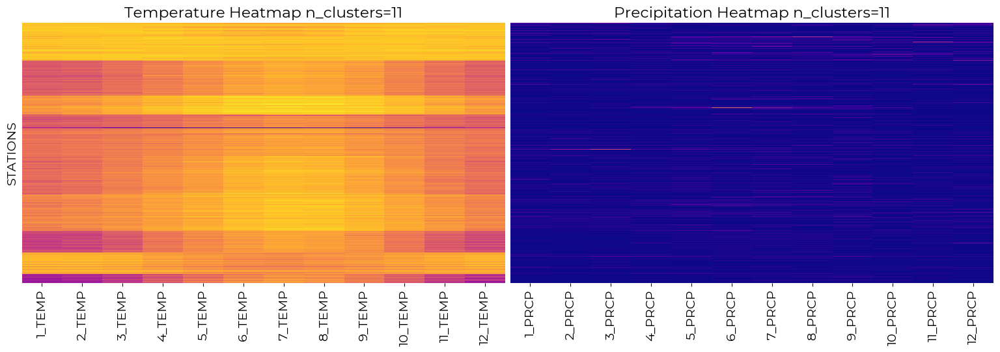

In [45]:
#=============================================================================
# Code generated by Artificial Intelligence (Google AI)
# Date: 2025-12-08
# Prompt: "The code demonstrates how to use Matplotlib subplots 
# to create distinct seaborn heatmaps for different DataFrame columns, allowing 
# each plot to have its own color scale and color bar.
# =============================================================================
fig = plt.figure(figsize=(15,4))

map_configurations = {'Temperature' : {'coords': fig.add_axes([0.0, 0.0, 0.495, 1.0]), 
                                               'cmap_name': 'plasma',
                                               'data_source': temp_pivot,
                                               'y_axis' : True
                                                 },

                      'Precipitation' : {'coords': fig.add_axes([0.5, 0.0, 0.495, 1.0]),
                                         'cmap_name': 'plasma',
                                         'data_source': precip_pivot,
                                         'y_axis' : False
                                        }
                     }

for key, value in map_configurations.items():
    sns.heatmap(data=monthly_pivot[value['data_source'].columns],
                ax=value['coords'],
                cmap=value['cmap_name'],
                cbar=False,
                annot=False,
                fmt=".1f"
    )

    if value['y_axis'] == False:
        value['coords'].set_yticks([])

        value['coords'].set_yticklabels([])
        
        value['coords'].set_ylabel("")

    else:
        value['coords'].set_yticks([])
    
        value['coords'].set_yticklabels([])
    
        value['coords'].set_ylabel("STATIONS")

    value['coords'].set_title(f'{key} Heatmap')

plt.show()

for n_clusters in k_values:
    fig = plt.figure(figsize=(15,4))
    plt.subplots_adjust(left=0.25, right=0.65, bottom=0.1, top=0.9, wspace=0.1)

    map_configurations = {'Temperature' : {'coords': fig.add_axes([0.0, 0.0, 0.495, 1.0]), 
                                               'cmap_name': 'plasma',
                                               'data_source': temp_pivot,
                                               'y_axis' : True
                                                 },

                          'Precipitation' : {'coords': fig.add_axes([0.5, 0.0, 0.495, 1.0]),
                                         'cmap_name': 'plasma',
                                         'data_source': precip_pivot,
                                         'y_axis' : False
                                                 }
                          }

    for key, value in map_configurations.items():
        sns.heatmap(data=monthly_pivot.sort_values(f"CLIMATE ZONE n_clusters={n_clusters}")[value['data_source'].columns],
                    ax=value['coords'],
                    cmap=value['cmap_name'],
                    cbar=False,
                    annot=False,
                    fmt=".1f"
        )
    
        if value['y_axis'] == False:
            value['coords'].set_yticks([])
    
            value['coords'].set_yticklabels([])

            value['coords'].set_ylabel("")

        else:
            value['coords'].set_yticks([])
    
            value['coords'].set_yticklabels([])
    
            value['coords'].set_ylabel("STATIONS")
    
        value['coords'].set_title(f'{key} Heatmap n_clusters={n_clusters}')
        

    plt.show()


The temperature and precipitation profiles are better displays of the effect of clustering.

The temperature heatmaps follow the temperature profiles. There was difficulty in establishing clusters in certain regions, specifically hot and humid and mediterranean. The precipitation heatmaps suggest that precipitation is not as important in determining clusters as temperature.

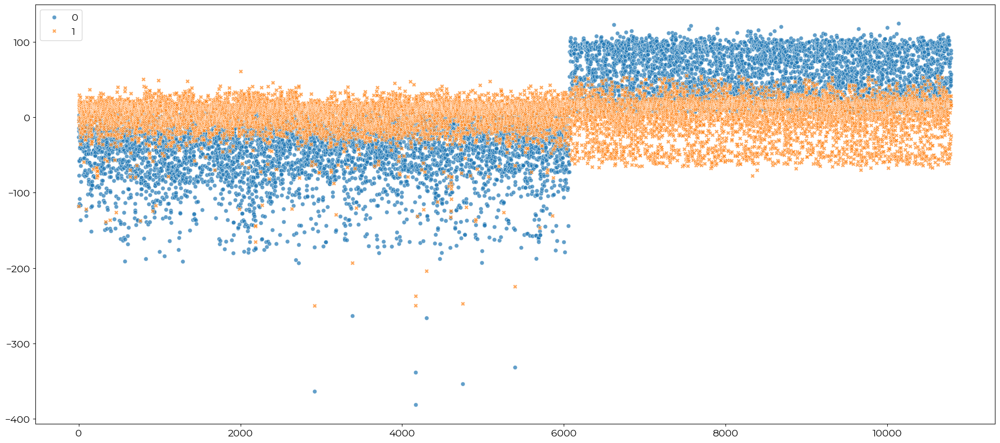

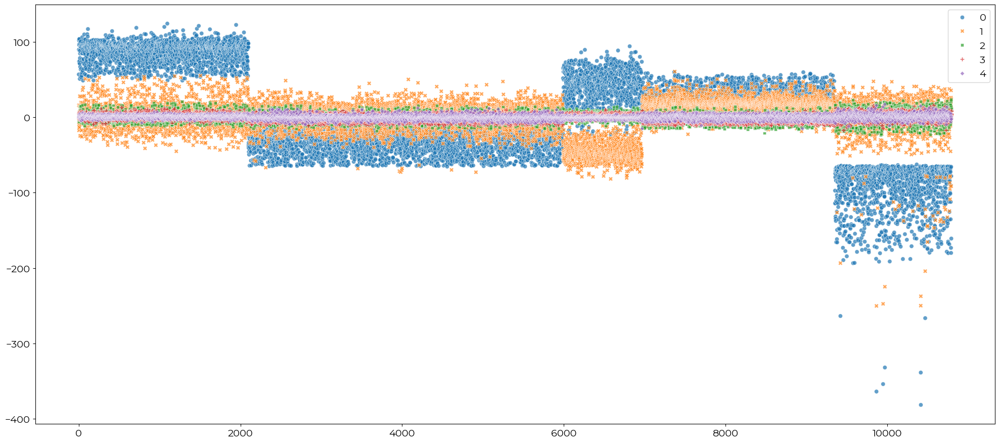

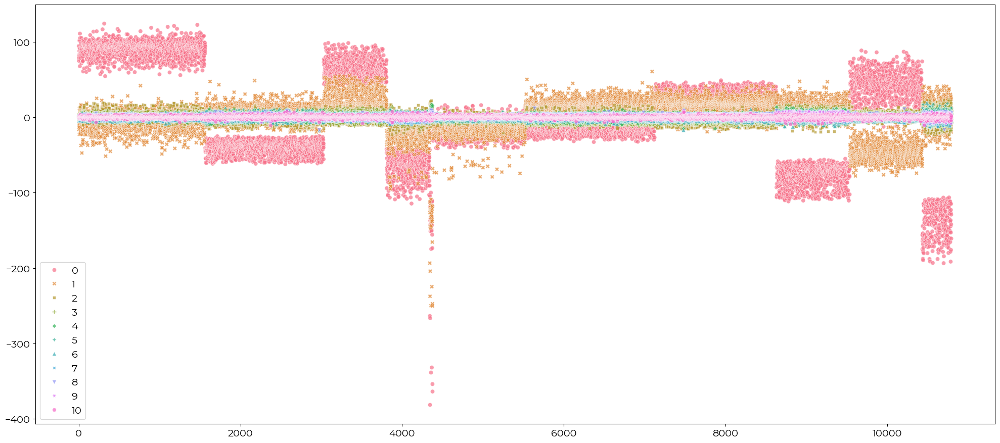

In [46]:
for n_clusters in k_values:
    pca_full = PCA(n_components=n_clusters, random_state=42)

    X_pca_full = pca_full.fit_transform(monthly_pivot.sort_values(f"CLIMATE ZONE n_clusters={n_clusters}")[temp_pivot.columns])

    fig = plt.figure(figsize=(20, 9))

    sns.scatterplot(
        data=X_pca_full,
        alpha=0.7
    )

    plt.tight_layout()

    plt.show()

Much like the above heatmaps, the plots of the n_clusters=5 and their subzones offer a better display of how exactly the clusters are determined. Parent Zone 0 outlines an area similar to the tropical climate zone in the n_clusters=2 model. Parent Zone 1 outlines an area similar to the temperature climate zone in the n_clusters=2 model, and shows an expected variation in temperature profile between winter and summer months.

The principal components = 2 PCA shows a cluster even across the domain and a cluster that varies on what I'm assuming is a temporal basis.